<a href="https://colab.research.google.com/github/lol-mann/Data_analytics/blob/master/cats_vs_dogs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
!pip install tensorflow==2.0.0-alpha0

     |████████████████████████████████| 79.9MB 314kB/s 
     |████████████████████████████████| 419kB 50.7MB/s 
     |████████████████████████████████| 3.0MB 44.5MB/s 
  Found existing installation: tensorflow 1.14.0
    Uninstalling tensorflow-1.14.0:
      Successfully uninstalled tensorflow-1.14.0


### downloading dataset

In [2]:
!wget --no-check-certificate \
  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip \
  -O /tmp/cats_and_dogs_filtered.zip

--2019-08-22 15:54:25--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.142.128, 2607:f8b0:400e:c03::80
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.142.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘/tmp/cats_and_dogs_filtered.zip’

/tmp/cats_and_dogs_ 100%[===================>]  65.43M  16.6MB/s    in 4.0s    

2019-08-22 15:54:30 (16.6 MB/s) - ‘/tmp/cats_and_dogs_filtered.zip’ saved [68606236/68606236]



In [0]:
!unzip /tmp/cats_and_dogs_filtered.zip -d /tmp/cats_and_dogs

### organising and visualizing data

In [0]:
import os

In [0]:
train_directory="/tmp/cats_and_dogs/cats_and_dogs_filtered/train/"
validation_directory="/tmp/cats_and_dogs/cats_and_dogs_filtered/validation/"

cats_train=os.path.join(train_directory,"cats")
dogs_train=os.path.join(train_directory,"dogs")

cats_validation=os.path.join(validation_directory,"cats")
dogs_validation=os.path.join(validation_directory,"dogs")

In [7]:
print("no of images in cat training dir \n"+30*"-")
print(len(os.listdir(cats_train)))
print()
print("no of images in dogs training dir \n"+30*"-")
print(len(os.listdir(dogs_train)))
print()
print("no of images in cat validation dir \n"+30*"-")
print(len(os.listdir(cats_validation)))
print()
print("no of images in dogs validation dir \n"+30*"-")
print(len(os.listdir(dogs_validation)))


no of images in cat training dir 
------------------------------
1000

no of images in dogs training dir 
------------------------------
1000

no of images in cat validation dir 
------------------------------
500

no of images in dogs validation dir 
------------------------------
500


In [0]:
%matplotlib inline

import matplotlib.image as mpimg
import matplotlib.pyplot as plt

# Parameters for our graph; we'll output images in a 4x4 configuration
nrows = 4
ncols = 4

pic_index = 0 # Index for iterating over images

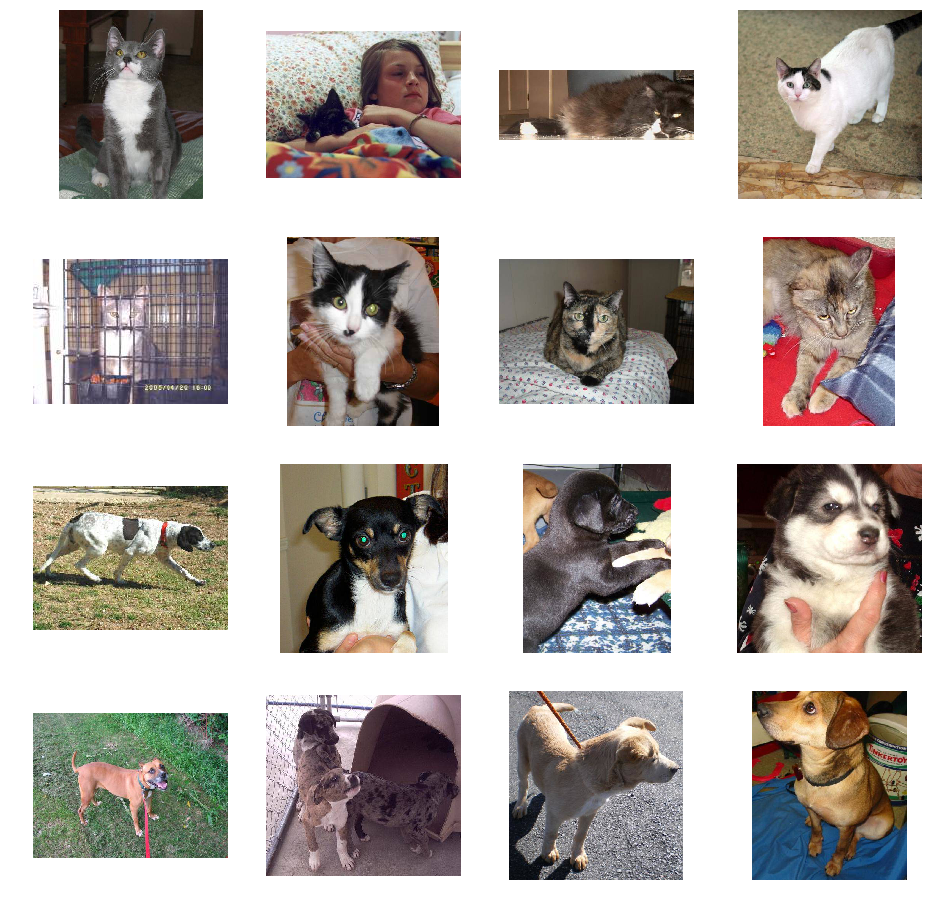

In [9]:
# Set up matplotlib fig, and size it to fit 4x4 pics
fig = plt.gcf()
fig.set_size_inches(ncols*4, nrows*4)

pic_index+=8

next_cat_pix = [os.path.join(cats_train, fname) 
                for fname in os.listdir( cats_train )[ pic_index-8:pic_index] 
               ]

next_dog_pix = [os.path.join(dogs_train, fname) 
                for fname in os.listdir( dogs_train )[ pic_index-8:pic_index]
               ]

for i, img_path in enumerate(next_cat_pix+next_dog_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

### building model

In [0]:
import tensorflow as tf

In [11]:
tf.compat.v1.test.is_gpu_available()

False

In [0]:
model=tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(8,(3,3),activation="relu",input_shape=(300,300,3)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(16,(3,3),activation="relu"),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(32,(3,3),activation="relu"),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64,(3,3),activation="relu"),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128,(3,3),activation="relu"),
    tf.keras.layers.MaxPooling2D(2,2),
    
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation= 'relu'),
    tf.keras.layers.Dense(1,activation="sigmoid")
]

)

In [13]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 298, 298, 8)       224       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 149, 149, 8)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 147, 147, 16)      1168      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 73, 73, 16)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 71, 71, 32)        4640      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 35, 35, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 33, 33, 64)        1

In [0]:
from tensorflow.keras.optimizers import RMSprop

In [0]:
model.compile(RMSprop(lr=0.001),
              "binary_crossentropy",
              ["acc"]
             )

### data processing and feeding

In [0]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [0]:
generate_train_data= ImageDataGenerator(rescale=1.0/255.0)
generate_test_data= ImageDataGenerator(rescale=1.0/255.0)

In [18]:
training_data_generator = generate_train_data.flow_from_directory(train_directory,
                                                                  batch_size=16,
                                                                  class_mode="binary",
                                                                  target_size=(300,300))

validation_data_generator = generate_test_data.flow_from_directory(validation_directory,
                                                                   batch_size=16,
                                                                   class_mode="binary",
                                                                   target_size=(300,300))

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


### Training

In [19]:
training_history = model.fit_generator(training_data_generator,
                                       validation_data=validation_data_generator,
                                       steps_per_epoch=100,
                                       epochs=12,
                                       validation_steps=50)

Epoch 1/12
100/100 [==============================] - 92s 916ms/step - loss: 0.7073 - acc: 0.5475 - val_loss: 0.6691 - val_acc: 0.6112
Epoch 2/12
100/100 [==============================] - 90s 900ms/step - loss: 0.6392 - acc: 0.6438 - val_loss: 0.5872 - val_acc: 0.6938
Epoch 3/12
100/100 [==============================] - 91s 910ms/step - loss: 0.5764 - acc: 0.6988 - val_loss: 0.6004 - val_acc: 0.6675
Epoch 4/12
100/100 [==============================] - 90s 904ms/step - loss: 0.5408 - acc: 0.7231 - val_loss: 0.6260 - val_acc: 0.7038
Epoch 5/12
100/100 [==============================] - 91s 911ms/step - loss: 0.5174 - acc: 0.7487 - val_loss: 0.6045 - val_acc: 0.7025
Epoch 6/12
100/100 [==============================] - 92s 923ms/step - loss: 0.4542 - acc: 0.7806 - val_loss: 0.6658 - val_acc: 0.6950
Epoch 7/12
100/100 [==============================] - 92s 915ms/step - loss: 0.4262 - acc: 0.8056 - val_loss: 0.6516 - val_acc: 0.6762
Epoch 8/12
100/100 [==============================] - 9

## test - 1

**finding some mindbending images to test the limit of the network**

**searching for fu\*\*\*ng 2 hours for similar looking images but some good result**

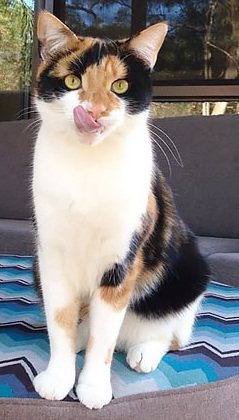

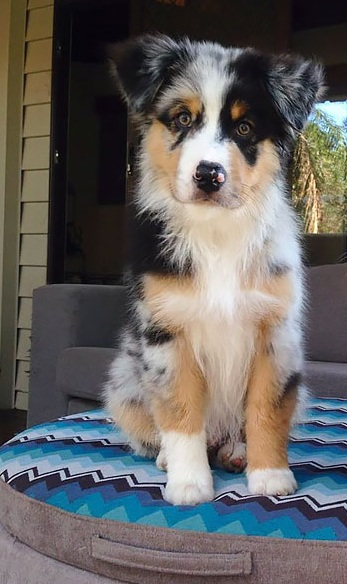

In [20]:
from IPython.display import Image, display
import numpy as np
display(Image('1.jpg'),Image('2.jpg'))

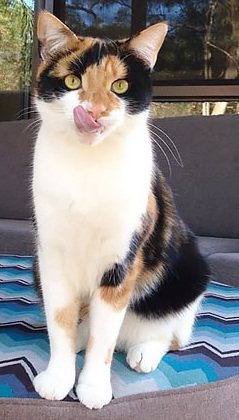

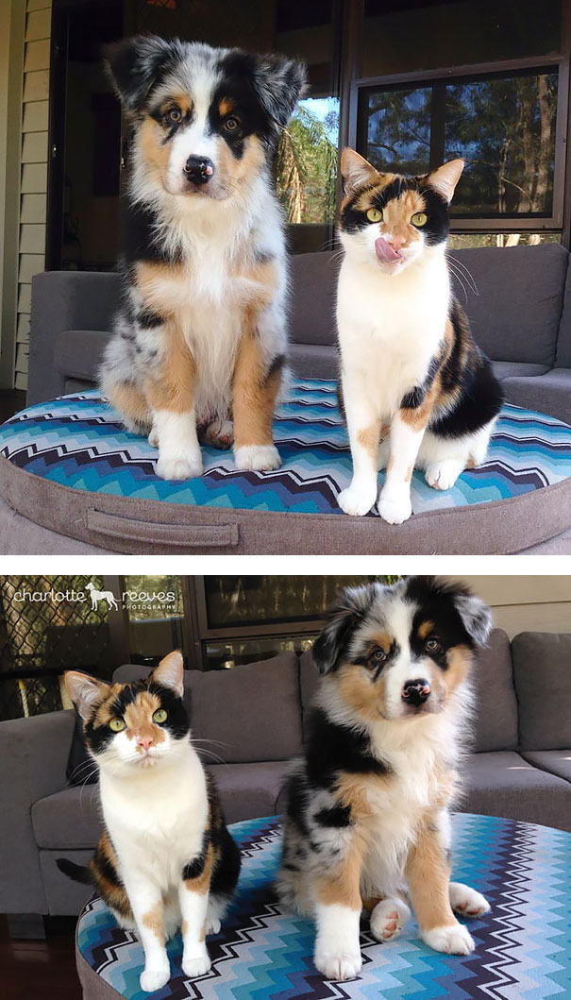

In [21]:
display(Image('1.jpg'),Image('3.jpg'))

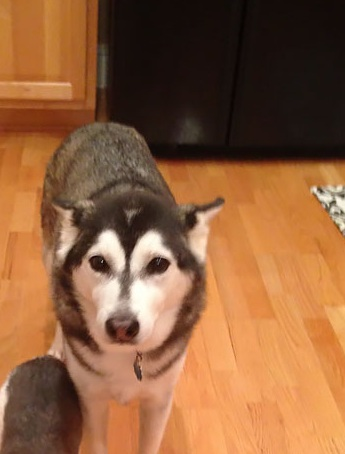

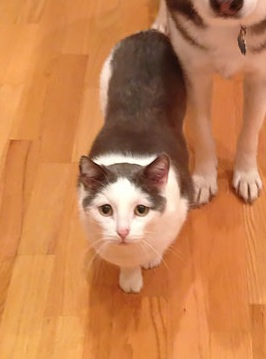

In [22]:
display(Image('4.jpg'),Image('5.jpg'))

**************************************************
editing the cat pic to look more like the dog
**************************************************


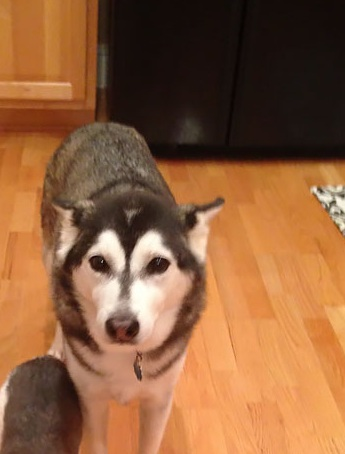

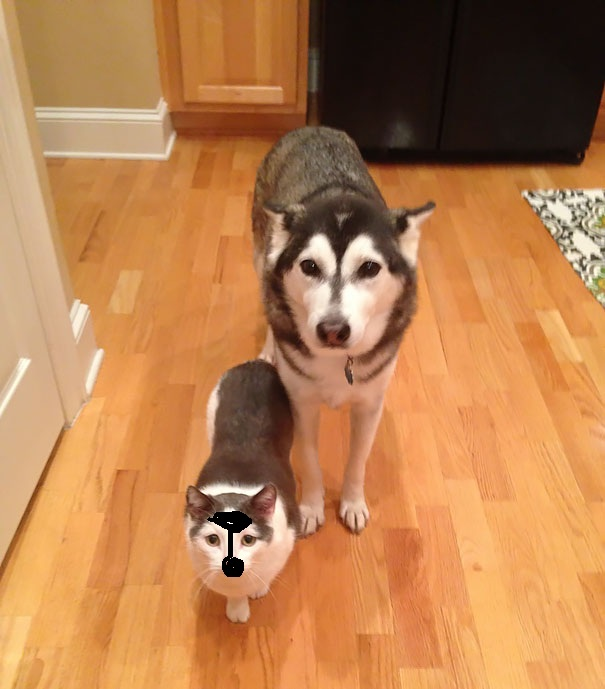

In [23]:
print(50*"*"+"\nediting the cat pic to look more like the dog\n"+50*"*")
display(
    Image('4.jpg',width=500,height=500),
    Image('6.jpg',width=500,height=500)
)

In [24]:
from keras.preprocessing import image

Using TensorFlow backend.


In [0]:
images=["1.jpg","2.jpg","3.jpg","4.jpg","5.jpg","6.jpg","7.jpg",]

In [0]:
def predict(images):
  for im in images:
    img=image.load_img(im, target_size=(300, 300))

    x=image.img_to_array(img)
    x=np.expand_dims(x, axis=0)
    images = np.vstack([x])

    classes = model.predict(images, batch_size=10)

    print(classes[0])

    if classes[0]>0:
      print(im + " is a dog")

    else:
      print(im + " is a cat")

In [31]:
predict(images)

[0.]
1.jpg is a cat
[1.]
2.jpg is a dog
[1.]
3.jpg is a dog
[1.]
4.jpg is a dog
[1.]
5.jpg is a dog
[1.]
6.jpg is a dog
[1.]
7.jpg is a dog


# **Result - 1**

**Our nn doesn't sucks on confusing images. they are very difficult images to recogonise**

> Cannot conclude anything significant as the pictures have both animals and looking similar. 
> Based on the result of 1 and 2 image we can conclude colour gets good weightage on our network (keeping the apperance simillar) 



![](https://66.media.tumblr.com/ad957a621177fc404b4872a628ff48a6/tumblr_p982l0zOyX1wxwjebo1_500.gif)

## test - 2

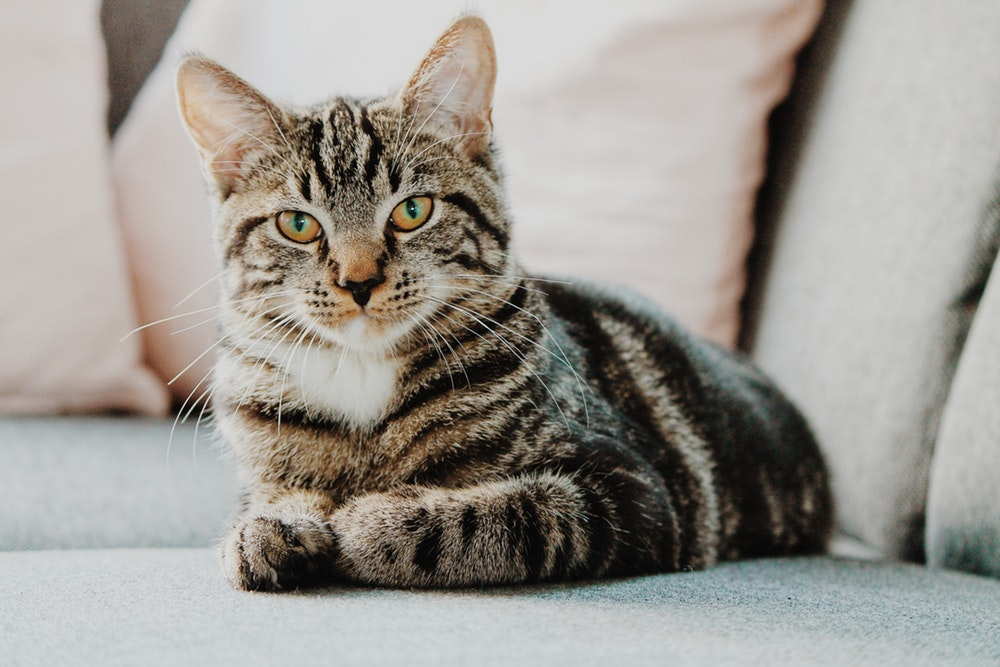

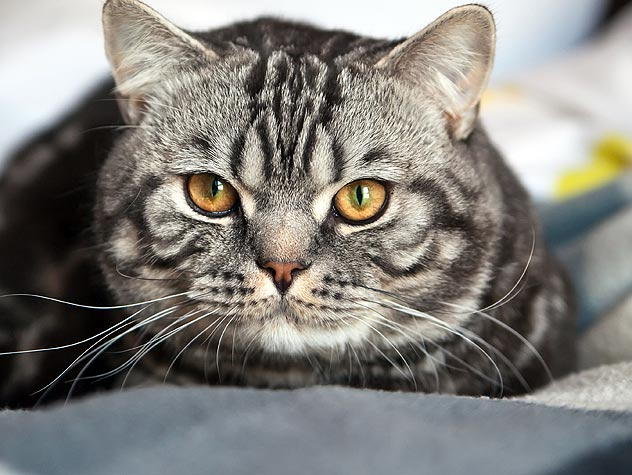

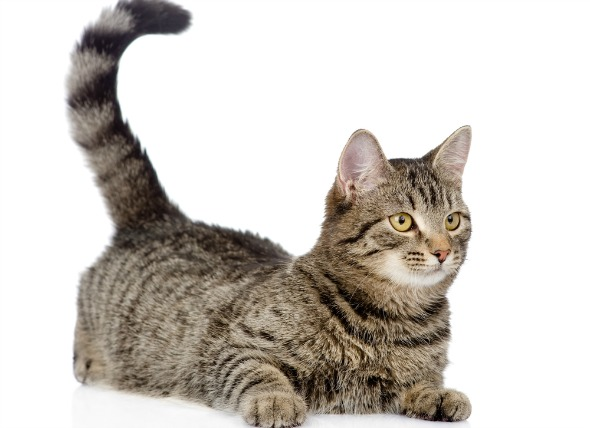

In [32]:
display(
    Image('8.jpg',width=100,height=100),
    Image('9.jpg',width=100,height=100),
    Image('10.jpg',width=100,height=100)
)

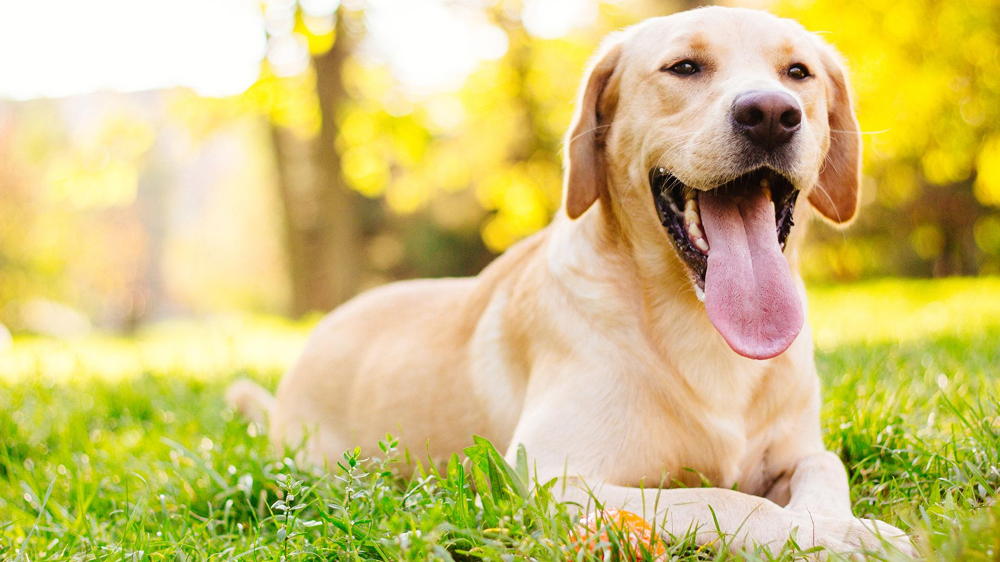

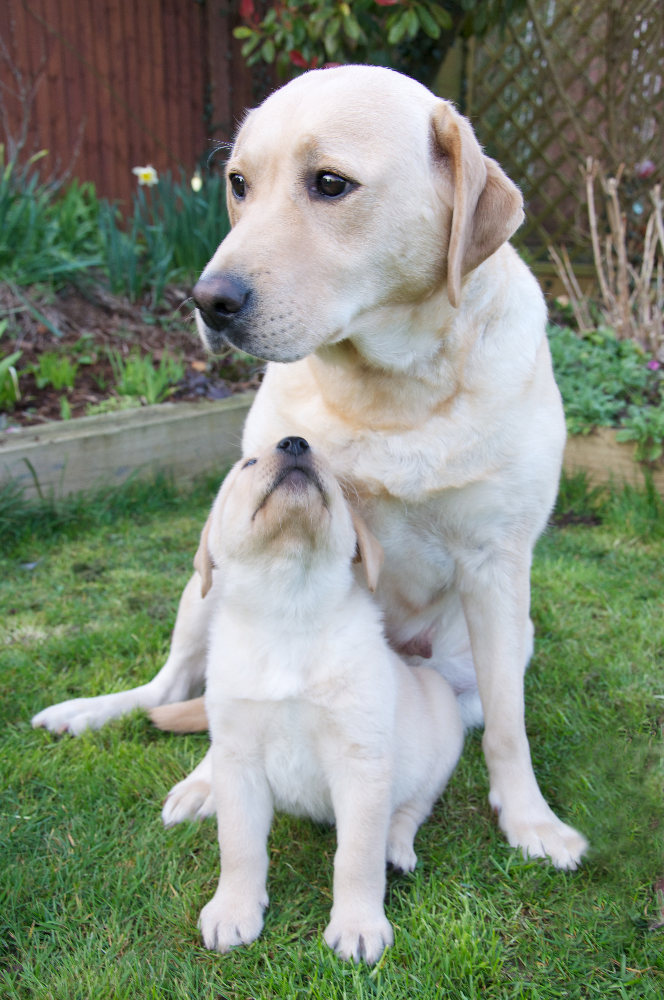

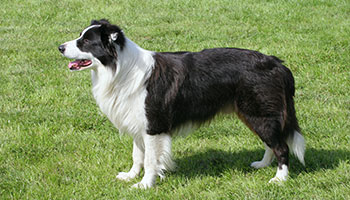

In [33]:
display(
    Image('11.jpg',width=100,height=100),
    Image('12.jpg',width=100,height=100),
    Image('13.jpg',width=100,height=100)
)

In [0]:
images=["8.jpg","9.jpg","10.jpg","11.jpg","12.jpg","13.jpg"]

In [35]:
predict(images)

[0.]
8.jpg is a cat
[0.]
9.jpg is a cat
[1.]
10.jpg is a dog
[1.]
11.jpg is a dog
[1.]
12.jpg is a dog
[1.]
13.jpg is a dog


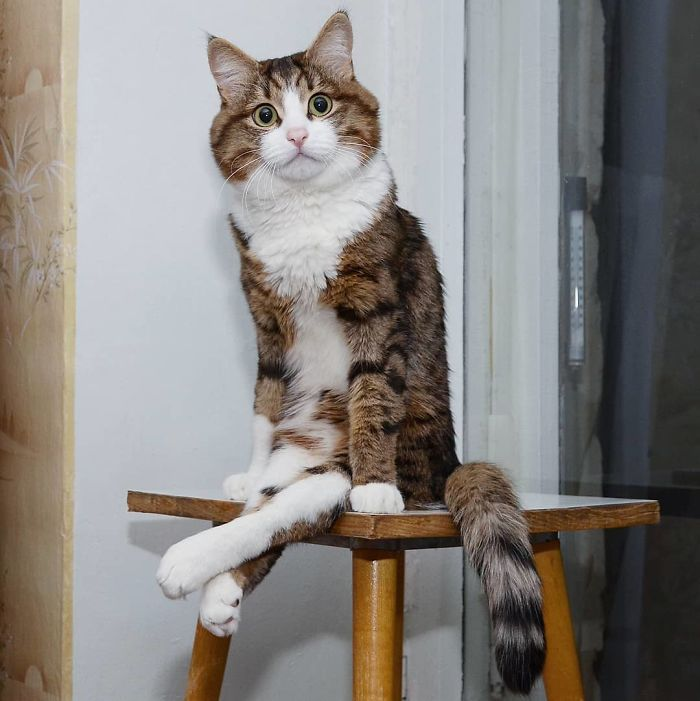

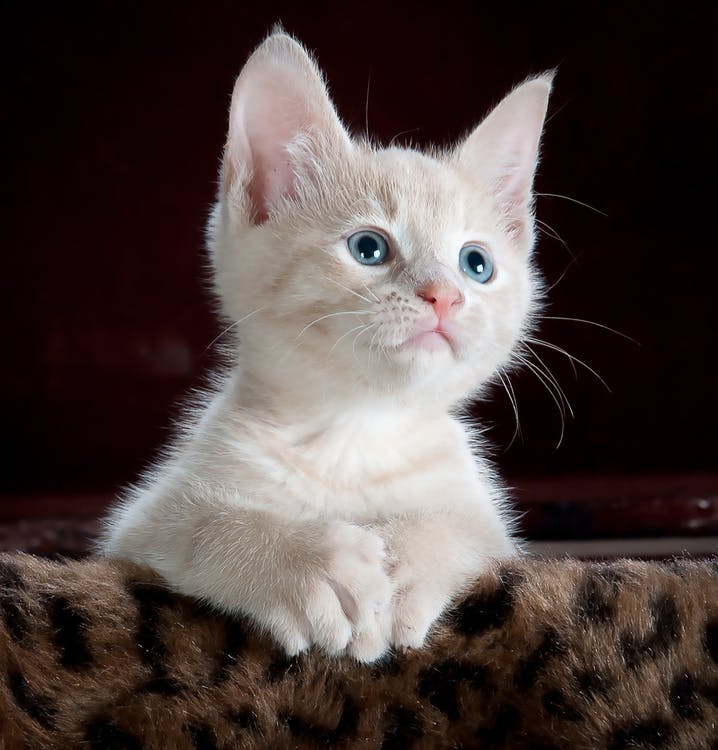

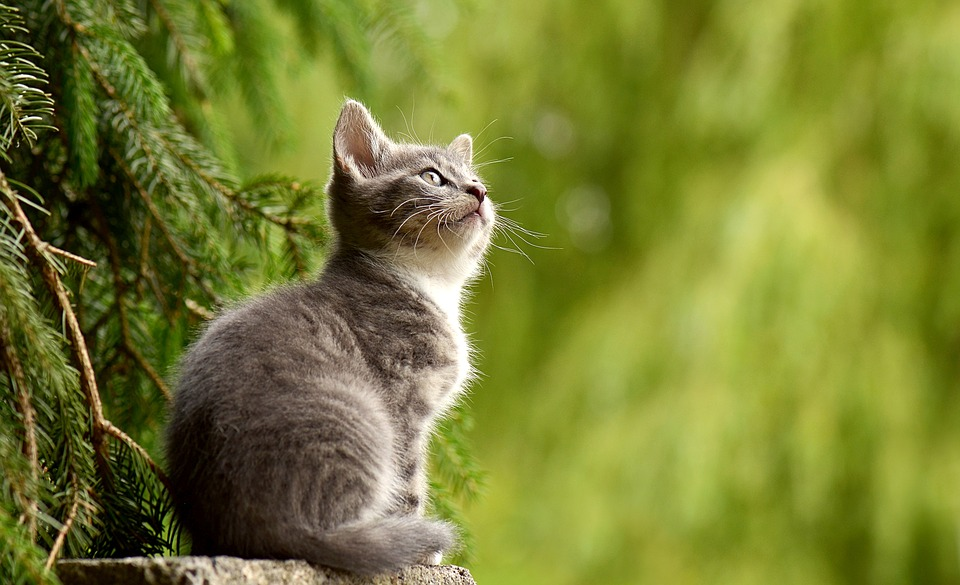

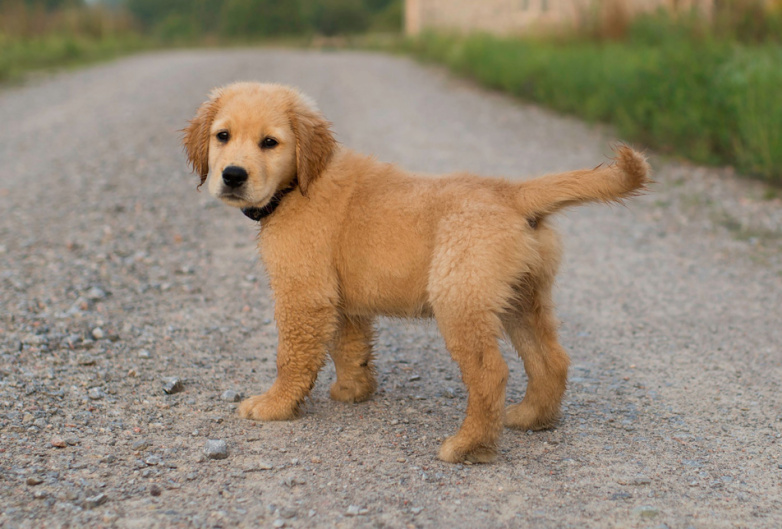

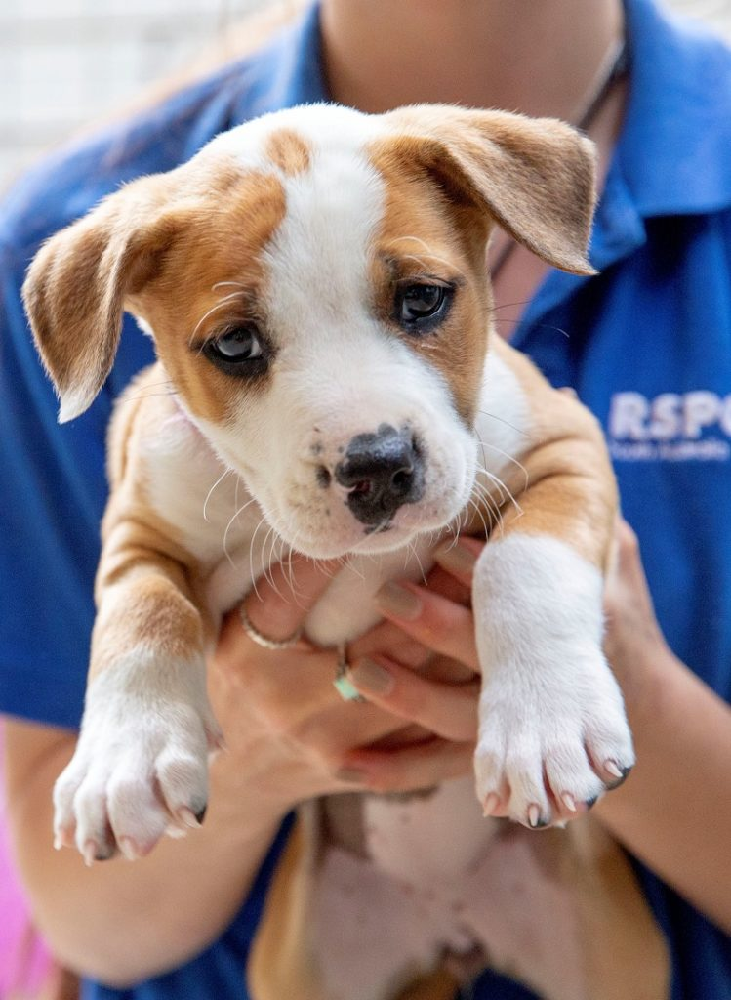

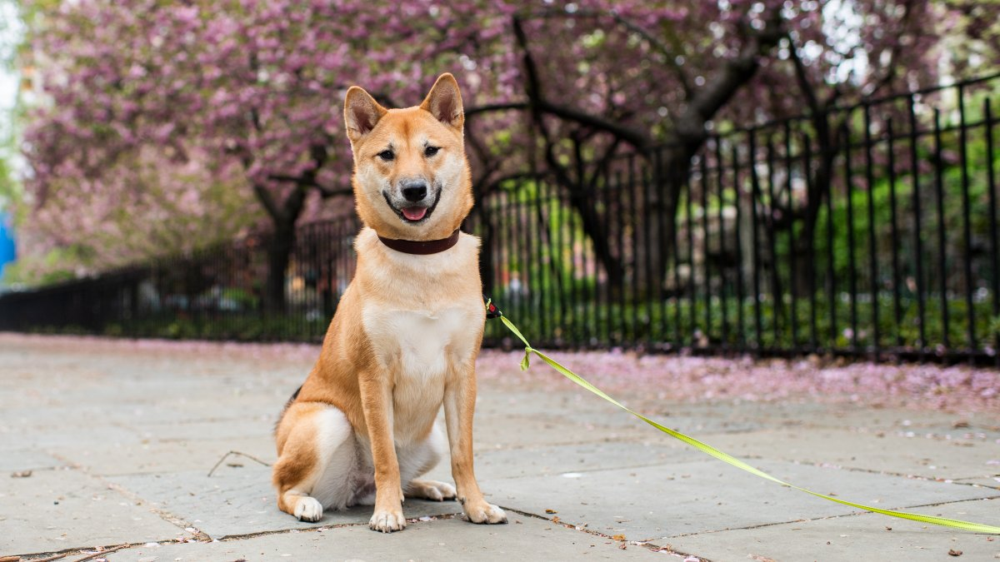

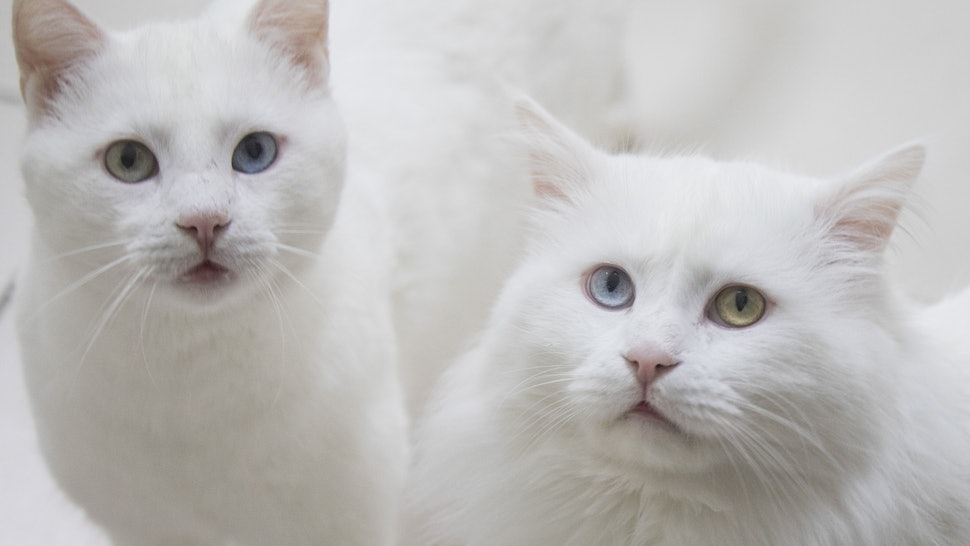

In [41]:
images=[
    "cat-1.jpg",
    "cat-2.jpeg",
    "cat-3.jpg",
    "dog-1.jpg",
    "dog-2.jpg",
    "dog-3.jpg",
    "cat-5.jpg"
]
display(*[Image(img,width=100,height=100) for img in images ])


In [40]:
predict(images)

[0.]
cat-1.jpg is a cat
[0.]
cat-2.jpeg is a cat
[1.]
cat-3.jpg is a dog
[1.]
dog-1.jpg is a dog
[1.]
dog-2.jpg is a dog
[0.]
dog-3.jpg is a cat
[1.]
cat-5.jpg is a dog


# **Result - 2**

Our nn is not that bad

> **70% accuracy**


![](https://media.giphy.com/media/uJSlAuoxMbl0A/giphy.gif)